In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import json
from tqdm import tqdm_notebook
from sklearn.metrics import *
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
import time
import string # библиотека для работы со строками
import re
import nltk   # Natural Language Toolkit
import pymorphy2 # Морфологический анализатор
import gensim.corpora as corpora
import gensim
from pprint import pprint
import seaborn as sns
import matplotlib.colors as mcolors
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
from collections import Counter
from matplotlib.patches import Rectangle
from matplotlib.ticker import FuncFormatter
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
%matplotlib inline
warnings.filterwarnings("ignore") 

In [2]:
with open('comments_all.json', encoding = 'utf-8') as json_file:
    data = json.load(json_file)

In [3]:
num = 300 

print("movie: ",          data[num]["name_movie"], "\n")
print("comment: \n",      data[num]["text_comment"], "\n")
print("date: ",           data[num]["date_comment"], "\n")
print("type: ",           data[num]["type_comment"], "\n")

movie:  Академия смерти 

comment: 
 Это очень хороший военно-исторический фильм об атмосфере, царящей в закрытом специализированном учебном учреждении Третьего Рейха-учреждении, готовящем будущую элиту общества Великой Германии. Создателям фильма удалось полностью передать эту атмосферу. Будто ты сам очевидец тех событий-и на улице, и в торжественном актовом зале, и на учениях.

Интересный уже сам по себе-ведь Третий Рейх был одним из самых ярких и сильных государств мира! 

Интересна линия отношений между подростками в этом фильме.

Фридрих Ваймер - талантливый боксер из рабочего квартала, мечтающий о лучшей судьбе, мужественный и сильный, упрямый, амбициозный; поступил в элитную школу Рейха против воли отца-рабочего, по собственному желанию, потому что 'такого шанса больше не будет...' 

Альбрехт Штайн - тонкий, хрупкий, романтичный, грустный и мечтательный юноша-эстет, индивидуалист, очень чувствительный; поступил в академию против своей воли, по воле своего отца-гауляйтера, так ка

In [4]:
def custom_preprocessor(text):
    '''
    Make text lowercase, remove text in square brackets,remove links,remove special characters
    and remove words containing numbers.
    '''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub("\\W"," ",text) # remove special chars
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub(' +', ' ', text)
    
    return text

In [5]:
nltk.download('stopwords')
stop_words = nltk.corpus.stopwords.words('russian')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\AlexandrGnusarev\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [6]:
dataFile = open('stopwords-ru.txt', encoding = 'utf-8')
stopwords_new = []
for line in dataFile:
    stopwords_new.append(line.replace('\n',''))

In [7]:
stop_words.extend(stopwords_new)

In [8]:
stop_words[-10:]

['этих',
 'это',
 'этого',
 'этой',
 'этом',
 'этому',
 'этот',
 'эту',
 'я',
 'являюсь']

In [9]:
dates = [str(x) for x in np.arange(0, 2022)]
def process_data(data):
    texts = []
    targets = []
    
    # поочередно проходим по всем новостям в списке
    for item in tqdm_notebook(data):
               
#         text_lower = item['text_comment'].lower() # приводим все слова к нижнему регистру
#         text_lower = ''.join(c for c in text_lower if c not in delSymbols)
        text_lower = custom_preprocessor(item['text_comment'])
        tokens     = word_tokenizer.tokenize(text_lower) #разбиваем екст на слова
        
        # удаляем пунктуацию и стоп-слова
        tokens = [word for word in tokens if (word not in string.punctuation and word not in stop_words and word not in dates)]
        
        texts.append(tokens) # добавляем в предобработанный список
    
    return texts

In [10]:
word_tokenizer = nltk.WordPunctTokenizer()
y = [item['type_comment'] for item in data]
texts = process_data(data)

  0%|          | 0/264759 [00:00<?, ?it/s]

In [11]:
i = 300
print("Label: ", y[i])
print("Tokens: ", texts[i][:20])

Label:  good
Tokens:  ['военно', 'исторический', 'фильм', 'атмосфере', 'царящей', 'закрытом', 'специализированном', 'учебном', 'учреждении', 'третьего', 'рейха', 'учреждении', 'готовящем', 'будущую', 'элиту', 'общества', 'великой', 'германии', 'создателям', 'фильма']


In [12]:
morph = pymorphy2.MorphAnalyzer()

In [13]:
# применяем лемматизацию ко всем текстам
for i in tqdm_notebook(range(len(texts))):           # tqdm_notebook создает шкалу прогресса :)
    text_lemmatized = [morph.parse(x)[0].normal_form for x in texts[i]] # применяем лемматизацию для каждого слова в тексте
    texts[i] = ' '.join(text_lemmatized)                # объединяем все слова в одну строку через пробел

  0%|          | 0/264759 [00:00<?, ?it/s]

In [14]:
# посмотрим на пример
i = 300
print("Label: ",   y[i])
print("Text: \n",  texts[i])

Label:  good
Text: 
 военный исторический фильм атмосфера царить закрытый специализировать учебный учреждение третий рейх учреждение готовить будущий элита общество великий германия создатель фильм удаться полностью передать атмосфера очевидец событие улица торжественный актовый зал учение интересный рейх один самый яркий сильный государство интересный линия отношение подросток фильм фридрих ваймер талантливый боксёр рабочий квартал мечтать хороший судьба мужественный сильный упрямый амбициозный поступить элитный школа рейх воля отец рабочий собственный желание такой шанс альбрехт штайна тонкий хрупкий романтичный грустный мечтательный юноша эстет индивидуалист чувствительный поступить академия воля воля отец гауляйтер давать определённый привилегия противоположность сходиться такой разный человек вырасти совершенно разный условие разный взгляд воспитание тянуть друг простой сильный хрупкий утончить фридрих альбрехт потянуться друг возможно сильно пробежать ток утверждать герой какой л

In [15]:
texts1 = []

for x in texts:
    tokens     = word_tokenizer.tokenize(x)
    texts1.append(tokens)

In [16]:
%%time
from gensim.models.ldamulticore import LdaMulticore
id2word = corpora.Dictionary(texts1)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts1]

# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=4, 
                                           random_state=100,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True,
                                               workers=8)

pprint(lda_model.print_topics())

[(0,
  '0.059*"фильм" + 0.010*"актёр" + 0.008*"сюжет" + 0.007*"хороший" + '
  '0.007*"роль" + 0.007*"игра" + 0.007*"герой" + 0.006*"просмотр" + '
  '0.006*"картина" + 0.005*"понравиться"'),
 (1,
  '0.008*"человек" + 0.007*"фильм" + 0.006*"жизнь" + 0.006*"герой" + '
  '0.005*"история" + 0.004*"любовь" + 0.004*"который" + 0.004*"картина" + '
  '0.004*"свой" + 0.003*"зритель"'),
 (2,
  '0.009*"персонаж" + 0.007*"часть" + 0.006*"первый" + 0.006*"новый" + '
  '0.004*"герой" + 0.004*"история" + 0.004*"злодей" + 0.004*"роль" + '
  '0.004*"комикс" + 0.004*"спецэффект"'),
 (3,
  '0.024*"фильм" + 0.005*"герой" + 0.004*"сюжет" + 0.004*"кино" + '
  '0.004*"первый" + 0.003*"зритель" + 0.003*"какой" + 0.003*"сцена" + '
  '0.003*"режиссёр" + 0.003*"такой"')]
Wall time: 4h 3min 9s


согласно нашей постановке выделилось 4 темы:

1. В первом топике
В первом топике наиболее часто встречающиеся словами: фильм, актер, сюжет, хороший, роль, и игра. Следовательно, в данных типах рецензий основой является, то как играют актёры и их место в сюжете фильме. Кратко, данную тему можно назвать: актер + сюжет.

2. Во втором топике же наиболее популярные словами являются: человек, фильм, жизнь, герой, история. Можно сказать, что в таких рецензиях важна интересная история в сюжете фильма, поведение человека. Чаще всего любовная история (так как слово "любовь" тоже часто встречается), но не обязательно. Возможно в таких фильмах поднимаются какие-то философские темы. Таким образом, тема данного топика - фильмы с глубоким смыслом / жизненные истории в фильмах.

3. Третий топик получился наиболее однозначным, так как здесь популярные слова: персонаж, герой, злодей, спецэффект, комикс. Очевидно, что такие слова встречаются в рецензиях на, как сейчас говорят, кинокомиксы, а также фантастические фильмы. Название данной темы - фантастика со спецэффектами.

4. Четвертый топик является самым неоднозначным для оценки, так как здесь частыми слова являются довольно общие термины: фильм, герой, сюжет, сцена, режиссёр. Можно сказать, что такие рецензии пишут на фильмы известных режиссёров, и то как раскрыты герои в сюжете. Название данной темы: фильмы известных режиссёров.

т.е. в основном по этим 4-м темам пишут рецензии на кинопоиске.

In [17]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=texts1)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,1.0,0.7568,"человек, фильм, жизнь, герой, история, любовь,...","[правосудие, искать, виновный, вместо, искать,..."
1,1,0.0,0.5510,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[вспомнить, прощать, честно, говорить, самый, ..."
2,2,0.0,0.6016,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[начитаться, отзыв, загореться, фильм, смотрет..."
3,3,0.0,0.6738,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[фильм, безусловно, провалиться, предречь, кан..."
4,4,1.0,0.7273,"человек, фильм, жизнь, герой, история, любовь,...","[любить, история, любить, чёрный, юмор, элемен..."
5,5,0.0,0.5204,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[честно, судить, фильм, признаться, воспринима..."
6,6,0.0,0.5375,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[собственно, кинотеатр, зал, выйти, отличный, ..."
7,7,3.0,0.5637,"фильм, герой, сюжет, кино, первый, зритель, ка...","[смело, заявлять, просмотр, кино, недоработать..."
8,8,0.0,0.5548,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[читать, одноимённый, книга, точнее, серия, кн..."
9,9,0.0,0.3715,"фильм, актёр, сюжет, хороший, роль, игра, геро...","[мелькать, первый, мысль, просмотр, данный, ки..."


<AxesSubplot:xlabel='Dominant_Topic'>

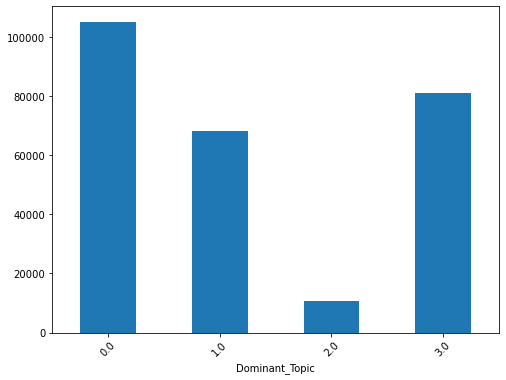

In [31]:
df_dominant_topic.groupby('Dominant_Topic').size().plot(kind='bar', rot=45, figsize=(8, 6))

в основном рецензии относятся к темам 0 и 3, чуть реже к 1 и совсем редко к 2.

+можно посмотреть к какой теме относится каждая рецензия

In [18]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.9970,"фильм, актёр, сюжет, хороший, роль, игра, герой, просмотр, картина, понравиться","[фильм, соседка, комната, ждать, сильно, посмотреть, фильм, честно, говорить, сильно, разочарова..."
1,1.0,0.9986,"человек, фильм, жизнь, герой, история, любовь, который, картина, свой, зритель","[выбор, правильный, оптика, помогать, раскрыть, сущность, объект, давать, возможность, предел, о..."
2,2.0,0.9595,"персонаж, часть, первый, новый, герой, история, злодей, роль, комикс, спецэффект","[мультик, отличный, тим, бартон, вновь, доказать, продюссер, прекрасный, деппа, мультик, получит..."
3,3.0,0.9978,"фильм, герой, сюжет, кино, первый, зритель, какой, сцена, режиссёр, такой","[данный, кино, отнести, разряд, додумать, дёшево, неистовый, злобно, рассказать, чисто, теоретич..."


и какие ключевые слова для каждой темы + текст наиболее полно отражающий данную тему.

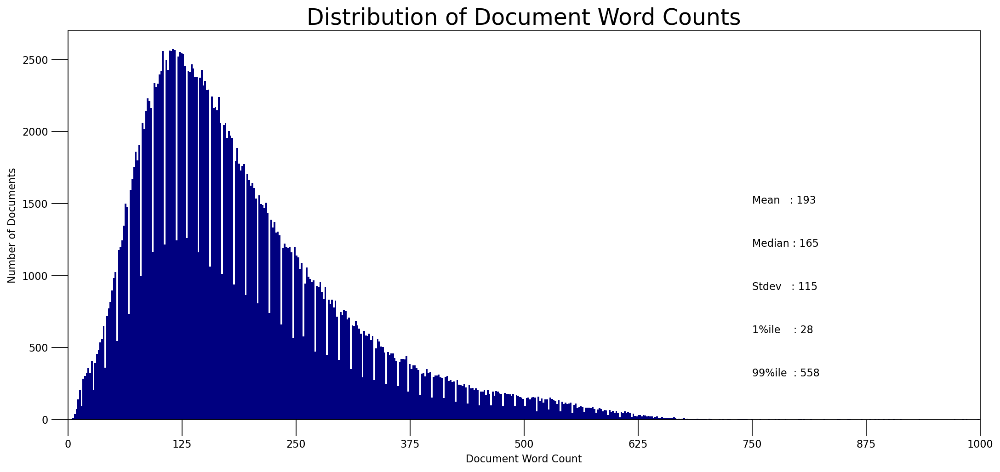

In [19]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 1500, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750, 1200, "Median : " + str(round(np.median(doc_lens))))
plt.text(750,  900, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750,  600, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750,  300, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

среднее число слов в рецензии 193.

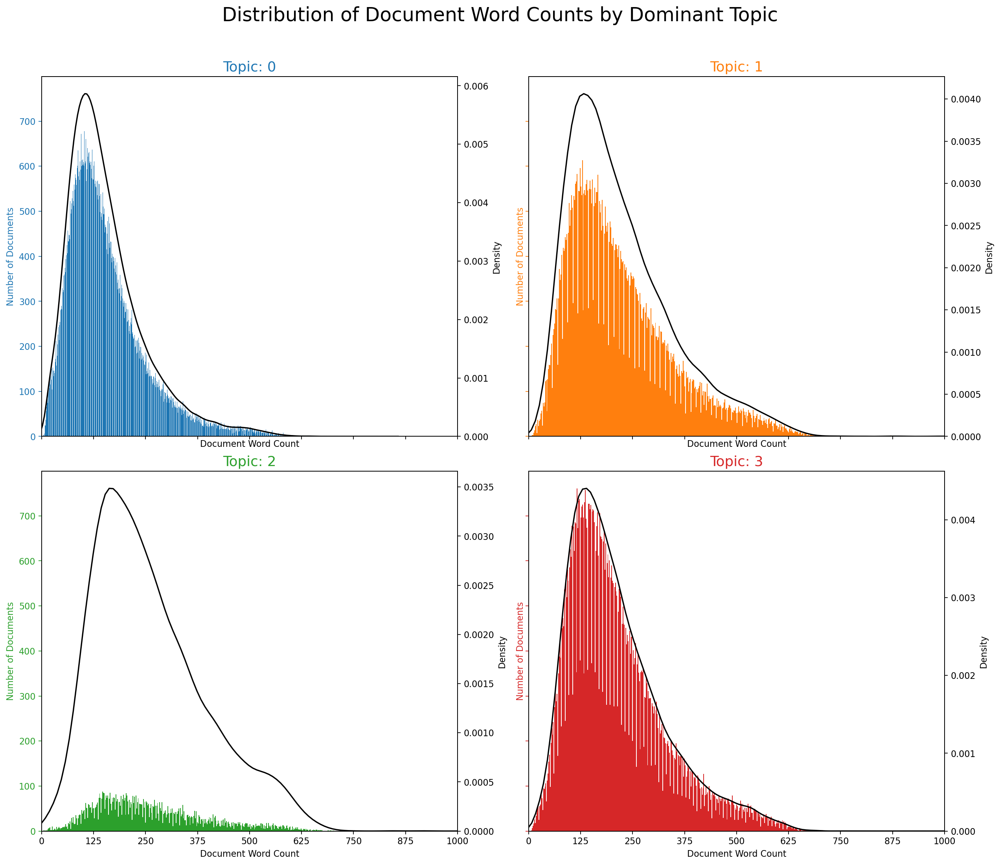

In [20]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(2,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 1000, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 1000), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,1000,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

такое же распределение можно построить и по темам.

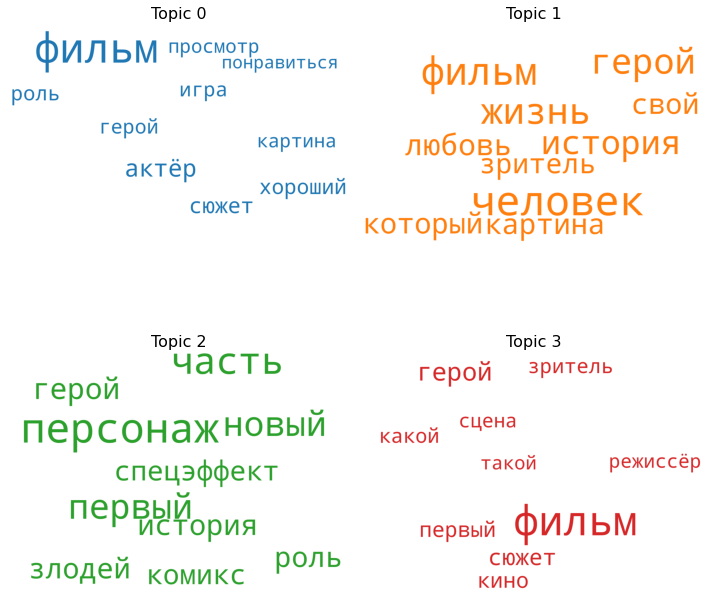

In [21]:
# 1. Wordcloud of Top N words in each topic
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

также построим облако слов по темам.

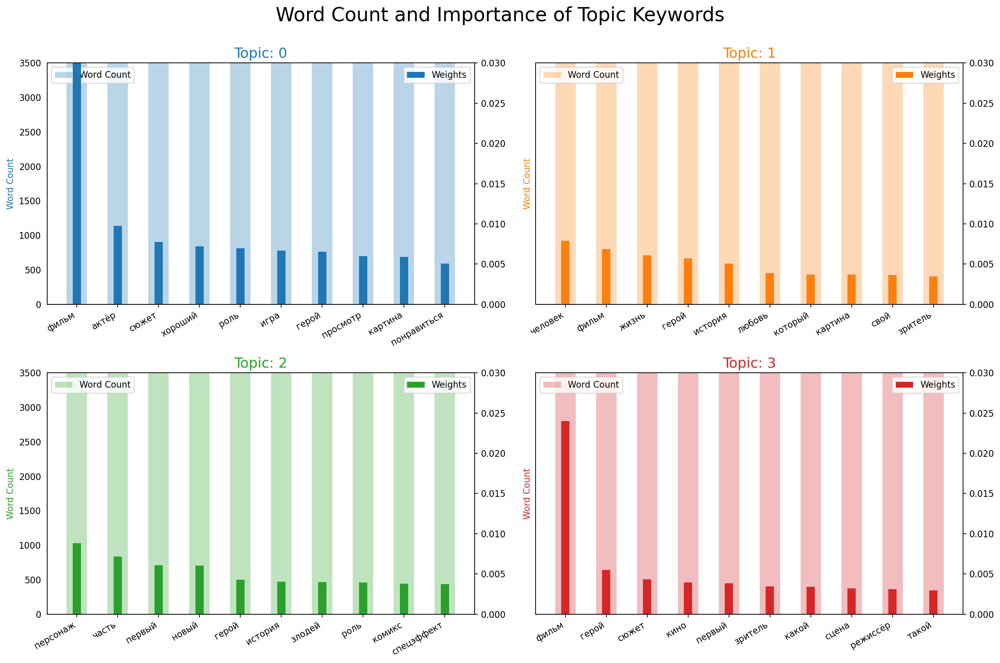

In [22]:
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in texts1 for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(2, 2, figsize=(16,10), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 3500)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

также можно посмотреть как часто ключевые слова встречаются в темах и их вес.

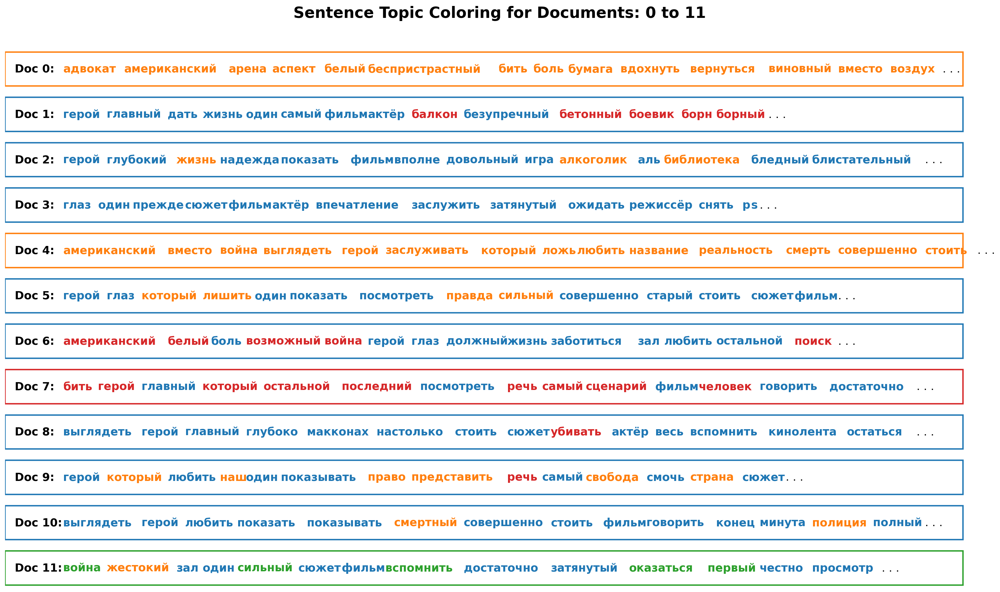

In [80]:
# Sentence Coloring of N Sentences
def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = []
            try:
                for wd, topic in wordid_topics:
                    word_dominanttopic.append((lda_model.id2word[wd], topic[0]))
            except:
                pass 
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)  

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart() 

также можно посмотреть какое слово в каждой рецензии относится к какой теме.

1. синий

2. оранжевый

3. зеленый 

4. красный

In [24]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

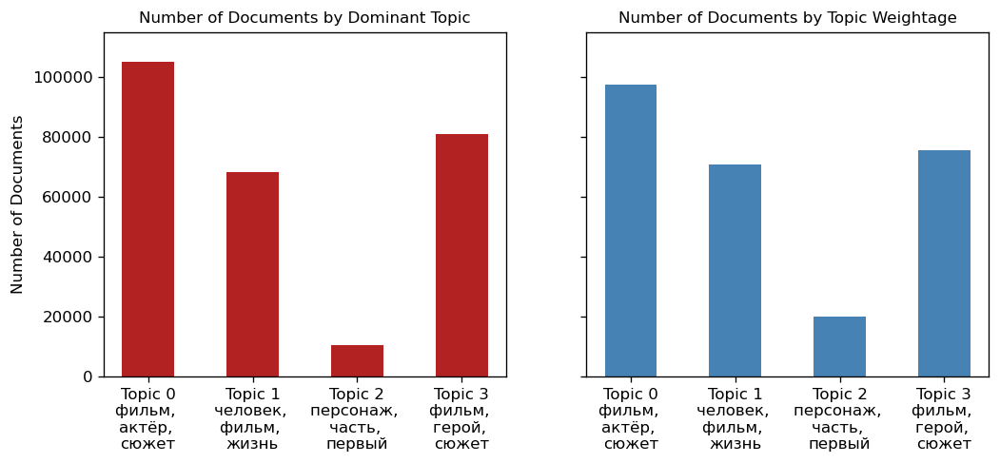

In [38]:
# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 115000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

еще раз посмотрим на общее число документов по темам и по весам каждой темы в документах 

In [26]:
# Get topic weights and dominant topics ------------
# Get topic weights
from bokeh.resources import INLINE
import bokeh.io

topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
bokeh.io.output_notebook(INLINE)
n_topics = 4
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 260309 samples in 6.789s...
[t-SNE] Computed neighbors for 260309 samples in 17.397s...
[t-SNE] Computed conditional probabilities for sample 1000 / 260309
[t-SNE] Computed conditional probabilities for sample 2000 / 260309
[t-SNE] Computed conditional probabilities for sample 3000 / 260309
[t-SNE] Computed conditional probabilities for sample 4000 / 260309
[t-SNE] Computed conditional probabilities for sample 5000 / 260309
[t-SNE] Computed conditional probabilities for sample 6000 / 260309
[t-SNE] Computed conditional probabilities for sample 7000 / 260309
[t-SNE] Computed conditional probabilities for sample 8000 / 260309
[t-SNE] Computed conditional probabilities for sample 9000 / 260309
[t-SNE] Computed conditional probabilities for sample 10000 / 260309
[t-SNE] Computed conditional probabilities for sample 11000 / 260309
[t-SNE] Computed conditional probabilities for sample 12000 / 260309
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 118000 / 260309
[t-SNE] Computed conditional probabilities for sample 119000 / 260309
[t-SNE] Computed conditional probabilities for sample 120000 / 260309
[t-SNE] Computed conditional probabilities for sample 121000 / 260309
[t-SNE] Computed conditional probabilities for sample 122000 / 260309
[t-SNE] Computed conditional probabilities for sample 123000 / 260309
[t-SNE] Computed conditional probabilities for sample 124000 / 260309
[t-SNE] Computed conditional probabilities for sample 125000 / 260309
[t-SNE] Computed conditional probabilities for sample 126000 / 260309
[t-SNE] Computed conditional probabilities for sample 127000 / 260309
[t-SNE] Computed conditional probabilities for sample 128000 / 260309
[t-SNE] Computed conditional probabilities for sample 129000 / 260309
[t-SNE] Computed conditional probabilities for sample 130000 / 260309
[t-SNE] Computed conditional probabilities for sample 131000 / 260309
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 237000 / 260309
[t-SNE] Computed conditional probabilities for sample 238000 / 260309
[t-SNE] Computed conditional probabilities for sample 239000 / 260309
[t-SNE] Computed conditional probabilities for sample 240000 / 260309
[t-SNE] Computed conditional probabilities for sample 241000 / 260309
[t-SNE] Computed conditional probabilities for sample 242000 / 260309
[t-SNE] Computed conditional probabilities for sample 243000 / 260309
[t-SNE] Computed conditional probabilities for sample 244000 / 260309
[t-SNE] Computed conditional probabilities for sample 245000 / 260309
[t-SNE] Computed conditional probabilities for sample 246000 / 260309
[t-SNE] Computed conditional probabilities for sample 247000 / 260309
[t-SNE] Computed conditional probabilities for sample 248000 / 260309
[t-SNE] Computed conditional probabilities for sample 249000 / 260309
[t-SNE] Computed conditional probabilities for sample 250000 / 260309
[t-SNE] Computed con

Loading BokehJS ...

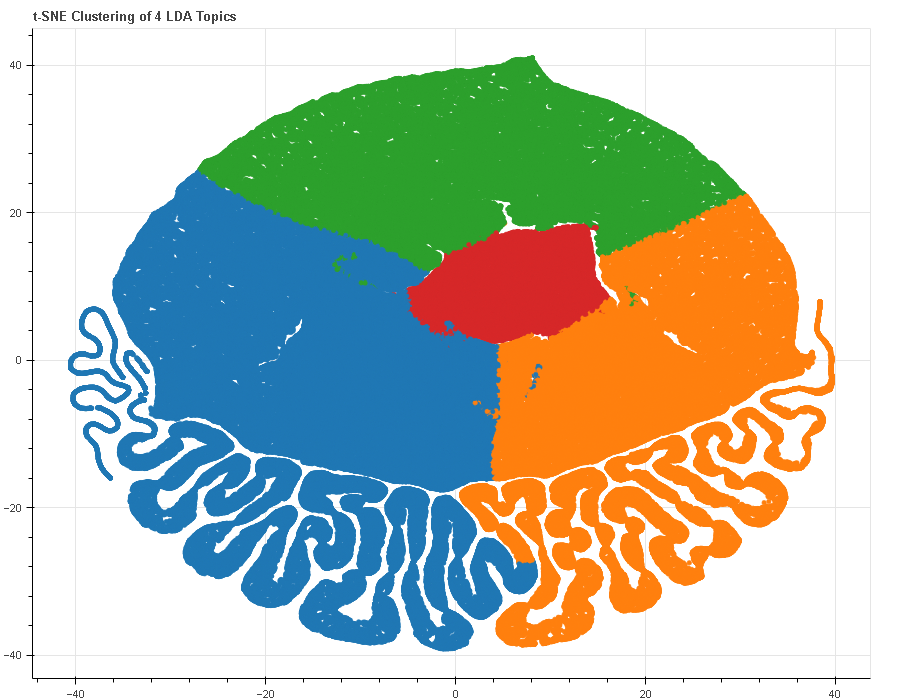

если попробовать визуазировать с помощью tSNE, то получится график выше.

In [27]:
pyLDAvis.enable_notebook()
vis = gensimvis.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.088986 -0.111801       1        1  31.425354
3     -0.034566 -0.027814       2        1  30.388112
1     -0.087895  0.135067       3        1  29.234624
2      0.211448  0.004548       4        1   8.951910, topic_info=          Term          Freq         Total Category  logprob  loglift
148      фильм  1.442669e+06  1.442669e+06  Default  30.0000  30.0000
545   персонаж  1.629490e+05  1.629490e+05  Default  29.0000  29.0000
158      актёр  1.976170e+05  1.976170e+05  Default  28.0000  28.0000
1356     часть  8.053700e+04  8.053700e+04  Default  27.0000  27.0000
41       жизнь  1.110500e+05  1.110500e+05  Default  26.0000  26.0000
...        ...           ...           ...      ...      ...      ...
524      образ  1.177457e+04  9.045809e+04   Topic4  -5.9617   0.3744
148      фильм  1.621946e+04  1.442670e+06   Topic4  -5.6415  -2.0747
140      сюжет  1.118709e+04  2.031343e+05   Topic4  -6.0129  -0.4858
485    картина  1.090543e+04  2.007288e+05   Topic4  -6.0384  -0.4994
270    хороший  1.028083e+04  1.824512e+05   Topic4  -6.0974  -0.4629

[387 rows x 6 columns], token_table=       Topic      Freq     Term
term                           
7531       4  0.999751       dc
7533       4  0.999820   marvel
7015       1  0.031709   аватар
7015       2  0.052115   аватар
7015       4  0.916192   аватар
...      ...       ...      ...
2138       4  0.000752   эмоция
16622      1  0.999285  энистон
10312      1  0.999257    эфрон
21907      1  0.999698     эшли
14178      1  0.998921    эштон

[750 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 4, 2, 3])

In [28]:
pyLDAvis.save_html(vis, 'lda.html')